In [67]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc("animation", html="jshtml")

# ----------------------------
# ПАРАМЕТРЫ ДОМАЕНА
# ----------------------------
Lx = 2.0
Ly = 1.0
nx = 200
ny = 100

dx = Lx/(nx-1)
dy = Ly/(ny-1)

nu = 0.01
dt = 0.0005
n_steps = 4000

cx, cy = 0.4, 0.5
R = 0.1

x = np.linspace(0, Lx, nx)
y = np.linspace(0, Ly, ny)
X, Y = np.meshgrid(x, y, indexing="ij")
cylinder = (X - cx)**2 + (Y - cy)**2 < R**2

# ----------------------------
# ОПЕРАТОРЫ
# ----------------------------
def laplacian(F):
    return ((np.roll(F,-1,0)-2*F+np.roll(F,1,0))/dx**2 +
            (np.roll(F,-1,1)-2*F+np.roll(F,1,1))/dy**2)

def divergence(u,v):
    return (
        (np.roll(u,-1,0)-np.roll(u,1,0))/(2*dx) +
        (np.roll(v,-1,1)-np.roll(v,1,1))/(2*dy)
    )

def grad_p(p):
    return (
        (np.roll(p,-1,0)-np.roll(p,1,0))/(2*dx),
        (np.roll(p,-1,1)-np.roll(p,1,1))/(2*dy)
    )

def pressure_poisson(p, div):
    for _ in range(50):
        p = (
            (np.roll(p,-1,0)+np.roll(p,1,0))*dy**2 +
            (np.roll(p,-1,1)+np.roll(p,1,1))*dx**2 -
            div*dx**2*dy**2
        ) / (2*(dx**2+dy**2))

        # Neumann BC
        p[:,0]  = p[:,1]
        p[:,-1] = p[:,-2]
        p[0,:]  = p[1,:]
        p[-1,:] = p[-2,:]

    p[cylinder] = 0
    return p


def upwind(F, u, v):
    Fx_plus  = (np.roll(F,-1,0)-F)/dx
    Fx_minus = (F-np.roll(F,1,0))/dx
    Fy_plus  = (np.roll(F,-1,1)-F)/dy
    Fy_minus = (F-np.roll(F,1,1))/dy
    return (
        u*np.where(u>0, Fx_minus, Fx_plus) +
        v*np.where(v>0, Fy_minus, Fy_plus)
    )


# ----------------------------
# НАЧАЛЬНЫЕ УСЛОВИЯ (правильные!)
# ----------------------------
u = np.zeros((nx, ny))   # А НЕ ones!
v = np.zeros((nx, ny))
p = np.zeros((nx, ny))


# ----------------------------
# ОДИН ШАГ NSE
# ----------------------------
def step_nse(u, v, p):

    # --- Стенки ---
    u[:,0] = 0
    u[:,-1] = 0
    v[:,0] = 0
    v[:,-1] = 0

    # Выход
    u[-1,:] = u[-2,:]
    v[-1,:] = 0

    # Цилиндр
    u[cylinder] = 0
    v[cylinder] = 0

    # --- Конвекция ---
    u_conv = upwind(u, u, v)
    v_conv = upwind(v, u, v)

    # --- Predictor ---
    u_star = u + dt*(nu*laplacian(u) - u_conv)
    v_star = v + dt*(nu*laplacian(v) - v_conv)

    u_star[cylinder] = 0
    v_star[cylinder] = 0

    # --- Давление ---
    div = divergence(u_star, v_star)
    p = pressure_poisson(p, div)
    dpdx, dpdy = grad_p(p)

    # --- Correction ---
    u_new = u_star - dt * dpdx
    v_new = v_star - dt * dpdy

    # Цилиндр снова no-slip
    u_new[cylinder] = 0
    v_new[cylinder] = 0

    # ВХОД — ПОСЛЕ CORRECTION (важно для “затекания”)
    u_new[0,:] = 1.0
    v_new[0,:] = 0

    return u_new, v_new, p# ----------------------------
# MAIN SOLVER STEP
# (baseline NSE step without DNN)
# ----------------------------
def step_nse(u, v, p):

    # --- BC on walls ---
    u[:,0]  = 0
    u[:,-1] = 0
    v[:,0]  = 0
    v[:,-1] = 0

    # --- Outlet ---
    u[-1,:] = u[-2,:]
    v[-1,:] = 0

    # --- Cylinder ---
    u[cylinder] = 0
    v[cylinder] = 0

    # --- Convection ---
    u_conv = upwind(u, u, v)
    v_conv = upwind(v, u, v)

    # --- Diffusion + predictor ---
    u_star = u + dt*(nu*laplacian(u) - u_conv)
    v_star = v + dt*(nu*laplacian(v) - v_conv)

    u_star[cylinder] = 0
    v_star[cylinder] = 0

    # --- Pressure solve ---
    div = divergence(u_star, v_star)
    p = pressure_poisson(p, div)
    dpdx, dpdy = grad_p(p)

    # --- Correction ---
    u_new = u_star - dt * dpdx
    v_new = v_star - dt * dpdy

    # Cylinder again no-slip
    u_new[cylinder] = 0
    v_new[cylinder] = 0

    # --- Inlet boundary applied at the END (important!) ---
    u_new[0,:] = 1.0
    v_new[0,:] = 0

    return u_new, v_new, p


# ----------------------------
# BASELINE SOLVER (NSE ONLY)
# ----------------------------
def run_baseline():
    # начальные условия
    u = np.zeros((nx, ny))
    v = np.zeros((nx, ny))
    p = np.zeros((nx, ny))

    frames = []

    for step in range(n_steps):

        # BC (абсолютно те же, что были у тебя в правильной версии)
        u[0,:]  = 1.0    # вход
        v[0,:]  = 0
        u[-1,:] = u[-2,:]
        v[-1,:] = 0
        u[:,0] = u[:,-1] = 0
        v[:,0] = v[:,-1] = 0

        u[cylinder] = 0
        v[cylinder] = 0

        # convection
        u_conv = upwind(u, u, v)
        v_conv = upwind(v, u, v)

        # predictor
        u_star = u + dt*(nu*laplacian(u) - u_conv)
        v_star = v + dt*(nu*laplacian(v) - v_conv)

        u_star[cylinder] = 0
        v_star[cylinder] = 0

        # pressure
        div = divergence(u_star, v_star)
        p = pressure_poisson(p, div)
        dpdx, dpdy = grad_p(p)

        # correction
        u = u_star - dt * dpdx
        v = v_star - dt * dpdy

        u[cylinder] = 0
        v[cylinder] = 0

        # collect frames
        if step % 20 == 0:
            frames.append(np.sqrt(u*u + v*v))

        if step % 200 == 0:
            print("baseline step", step)

    return frames


baseline step 0
baseline step 200
baseline step 400
baseline step 600
baseline step 800
baseline step 1000
baseline step 1200
baseline step 1400
baseline step 1600
baseline step 1800
baseline step 2000
baseline step 2200
baseline step 2400
baseline step 2600
baseline step 2800
baseline step 3000
baseline step 3200
baseline step 3400
baseline step 3600
baseline step 3800


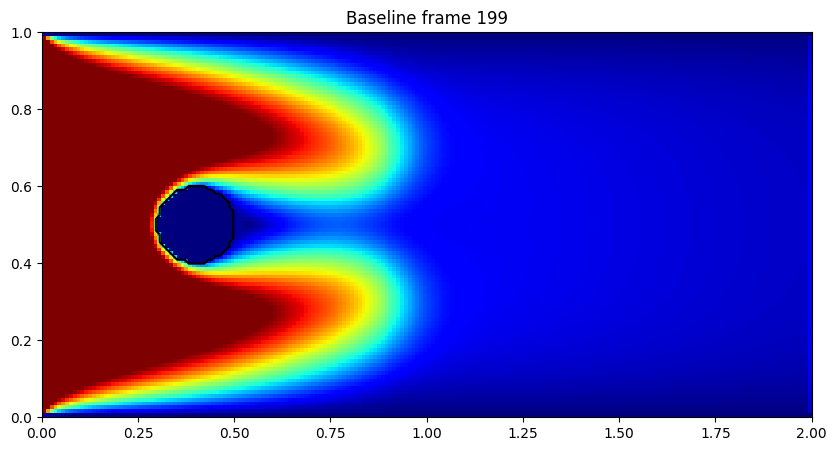

In [68]:
frames_base = run_baseline()

fig, ax = plt.subplots(figsize=(12,5))
im = ax.imshow(frames_base[0].T, origin='lower', cmap='jet', extent=[0,Lx,0,Ly])
ax.contour(X, Y, cylinder, [0.5], colors='black')

def update(i):
    im.set_data(frames_base[i].T)
    ax.set_title(f"Baseline frame {i}")
    return [im]

ani_base = animation.FuncAnimation(fig, update, frames=len(frames_base), interval=40)
ani_base



In [103]:
import torch
import torch.nn as nn
import torch.optim as optim

# ----------------------------
# DNN ≈ identity smoother
# ----------------------------
class DNNSmoother(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(2, 8, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(8, 8, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(8, 2, 3, padding=1)
        )

    def forward(self, r):
        return self.net(r)


# модель
model = DNNSmoother()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
loss_fn = nn.MSELoss()

# ----------------------------
# TRAIN IDENTITY (корректор не должен менять решение)
# ----------------------------
dataset = []
for _ in range(20):
    u0 = np.random.randn(nx, ny)*0.01
    v0 = np.random.randn(nx, ny)*0.01
    inp = np.stack([u0, v0], axis=0).astype(np.float32)
    dataset.append((inp, inp.copy()))

for epoch in range(3):
    losses = []
    for inp, tgt in dataset:
        r = torch.tensor(inp).unsqueeze(0)
        t = torch.tensor(tgt).unsqueeze(0)
        pred = model(r)
        loss = loss_fn(pred, t)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
    print("epoch", epoch, "loss", np.mean(losses))


# ----------------------------
# DNN SOFT CORRECTION
# ----------------------------
def apply_dnn(u, v, model, alpha=0.001):
    """
    d ≈ (u, v), поэтому изменение минимально.
    """
    r = np.stack([u, v], axis=0).astype(np.float32)
    r_t = torch.tensor(r).unsqueeze(0)

    with torch.no_grad():
        d = model(r_t).numpy()[0]

    u_new = u + alpha*(d[0] - u)
    v_new = v + alpha*(d[1] - v)
    return u_new, v_new




epoch 0 loss 0.008545833150856197
epoch 1 loss 0.0065537249436602
epoch 2 loss 0.005024460656568408


In [104]:
# ----------------------------
# DNN ENHANCED SOLVER
# ----------------------------
def run_dnn(alpha=0.001, model = model):
    u = np.zeros((nx, ny))
    v = np.zeros((nx, ny))
    p = np.zeros((nx, ny))

    frames = []

    for step in range(n_steps):

        # 1) обычный шаг NSE (baseline)
        u, v, p = step_nse(u, v, p)

        # 2) мягкая коррекция нейросеткой
        u, v = apply_dnn(u, v, model, alpha=alpha)

        # 3) No-slip снова (гарантия корректности)
        u[cylinder] = 0
        v[cylinder] = 0

        # 4) сохраняем кадры
        if step % 20 == 0:
            frames.append(np.sqrt(u*u + v*v))

        if step % 200 == 0:
            print("dnn step", step)

    return frames





In [109]:
frames_dnn = run_dnn(alpha=0.0001)

dnn step 0
dnn step 200
dnn step 400
dnn step 600
dnn step 800
dnn step 1000
dnn step 1200
dnn step 1400
dnn step 1600
dnn step 1800
dnn step 2000
dnn step 2200
dnn step 2400
dnn step 2600
dnn step 2800
dnn step 3000
dnn step 3200
dnn step 3400
dnn step 3600
dnn step 3800


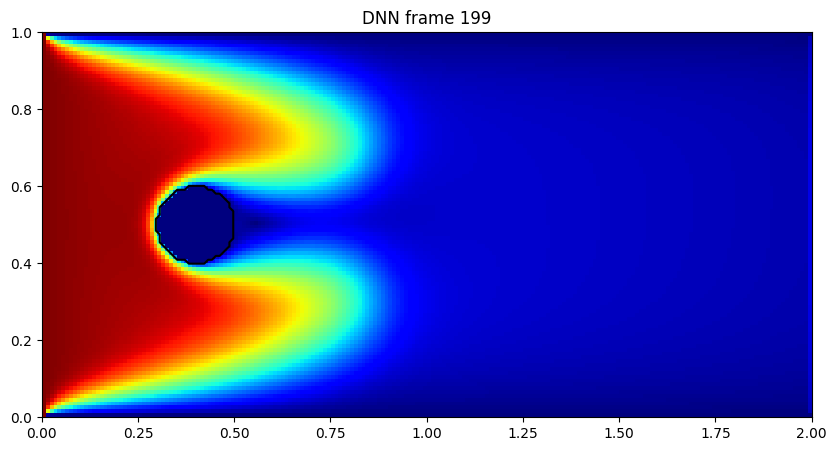

In [110]:
fig, ax = plt.subplots(figsize=(12,5))
im = ax.imshow(frames_dnn[0].T, origin="lower", cmap="jet", extent=[0,Lx,0,Ly])
ax.contour(X, Y, cylinder, [0.5], colors="black")

def update_dnn(i):
    im.set_data(frames_dnn[i].T)
    ax.set_title(f"DNN frame {i}")
    return [im]

ani_dnn = animation.FuncAnimation(fig, update_dnn, frames=len(frames_dnn), interval=40)
ani_dnn


In [91]:
train_inputs = []
train_targets = []

# Запускаем baseline коротко: 300 итераций
u = np.zeros((nx, ny))
v = np.zeros((nx, ny))
p = np.zeros((nx, ny))

for step in range(300):
    # обычный шаг NSE
    u_old = u.copy()
    v_old = v.copy()

    u, v, p = step_nse(u, v, p)

    # то, что solver делает на шаге коррекции:
    inp = np.stack([u_old, v_old], axis=0).astype(np.float32)
    tgt = np.stack([u, v], axis=0).astype(np.float32)

    train_inputs.append(inp)
    train_targets.append(tgt)

train_inputs = np.stack(train_inputs)
train_targets = np.stack(train_targets)

print("dataset shape:", train_inputs.shape)


dataset shape: (300, 2, 200, 100)


In [97]:
import torch
import torch.nn as nn

class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.ReLU()
        )
    def forward(self, x):
        return self.conv(x)

class UNetCorrector(nn.Module):
    def __init__(self):
        super().__init__()

        self.down1 = ConvBlock(2, 32)
        self.pool1 = nn.MaxPool2d(2)

        self.down2 = ConvBlock(32, 64)
        self.pool2 = nn.MaxPool2d(2)

        self.mid = ConvBlock(64, 128)

        self.up2 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.block2 = ConvBlock(64+64, 64)

        self.up1 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.block1 = ConvBlock(32+32, 32)

        self.out = nn.Conv2d(32, 2, 1)

    def forward(self, x):
        # encoder
        d1 = self.down1(x)
        p1 = self.pool1(d1)

        d2 = self.down2(p1)
        p2 = self.pool2(d2)

        # middle
        m = self.mid(p2)

        # decoder
        u2 = self.up2(m)
        c2 = torch.cat([u2, d2], dim=1)
        d2u = self.block2(c2)

        u1 = self.up1(d2u)
        c1 = torch.cat([u1, d1], dim=1)
        d1u = self.block1(c1)

        return self.out(d1u)


In [100]:
def apply_dnn_direct(u, v, model):
    inp = np.stack([u, v], axis=0).astype(np.float32)
    r = torch.tensor(inp).unsqueeze(0)

    with torch.no_grad():
        d = model(r).numpy()[0]

    # d[0] — обновлённое u, d[1] — обновлённое v
    return d[0], d[1]

# ----------------------------
# DNN ENHANCED SOLVER
# ----------------------------
def run_dnn_direct(model = model):
    u = np.zeros((nx, ny))
    v = np.zeros((nx, ny))
    p = np.zeros((nx, ny))

    frames = []

    for step in range(n_steps):

        # 1) обычный шаг NSE (baseline)
        u, v, p = step_nse(u, v, p)

        # 2) мягкая коррекция нейросеткой
        u, v = apply_dnn_direct(u, v, model)

        # 3) No-slip снова (гарантия корректности)
        u[cylinder] = 0
        v[cylinder] = 0

        # 4) сохраняем кадры
        if step % 20 == 0:
            frames.append(np.sqrt(u*u + v*v))

        if step % 200 == 0:
            print("dnn step", step)

    return frames






In [99]:
model = UNetCorrector()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
loss_fn = nn.MSELoss()

for epoch in range(8):
    losses = []
    for inp, tgt in zip(train_inputs, train_targets):
        r = torch.tensor(inp).unsqueeze(0)
        t = torch.tensor(tgt).unsqueeze(0)

        pred = model(r)
        loss = loss_fn(pred, t)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        losses.append(loss.item())

    print("epoch", epoch, "loss", np.mean(losses))


epoch 0 loss 0.0009800425471621565
epoch 1 loss 5.32449266089922e-05
epoch 2 loss 3.0208252001102663e-05
epoch 3 loss 2.2747536246091234e-05
epoch 4 loss 1.8132105092263375e-05
epoch 5 loss 1.5536534094546064e-05
epoch 6 loss 1.30364321533231e-05
epoch 7 loss 1.1156209449344109e-05


In [101]:
frames_dnn = run_dnn_direct(model=model)


dnn step 0
dnn step 200
dnn step 400
dnn step 600
dnn step 800
dnn step 1000
dnn step 1200
dnn step 1400
dnn step 1600
dnn step 1800
dnn step 2000
dnn step 2200
dnn step 2400
dnn step 2600
dnn step 2800
dnn step 3000
dnn step 3200
dnn step 3400
dnn step 3600
dnn step 3800


In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
im = ax.imshow(frames_dnn[0].T, origin="lower", cmap="jet", extent=[0,Lx,0,Ly])
ax.contour(X, Y, cylinder, [0.5], colors="black")

def update_dnn(i):
    im.set_data(frames_dnn[i].T)
    ax.set_title(f"DNN frame {i}")
    return [im]

ani_dnn = animation.FuncAnimation(fig, update_dnn, frames=len(frames_dnn), interval=40)
ani_dnn
